# Lab 9- Deep Learning Model

This lab is meant to get you started in using Keras to design Deep Neural Networks. The goal here is to simply repeat your previous lab, but with DNNs.

Let's start with reading the data, like before:

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

filename="C:/Users/max dore/Downloads/SUSY.csv"
VarNames=["signal", "l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]
RawNames=["l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi","MET", "MET_phi", "MET_rel", "axial_MET"]
FeatureNames=["M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

df = pd.read_csv(filename, dtype='float64', names=VarNames)

Now lets define training and test samples. Note that DNNs take very long to train, so for testing purposes we will use only about 10% of the 5 million events in the training/validation sample. Once you get everything working, make the final version of your plots with the full sample. 

Also note that Keras had trouble with the Pandas tensors, so after doing all of the nice manipulation that Pandas enables, we convert the Tensor to a regular numpy tensor.

In [8]:
N_Max=550000
N_Train=500000

Train_Sample=df[:N_Train]
Test_Sample=df[N_Train:N_Max]

X_train=np.array(Train_Sample[VarNames[1:]])
y_train=np.array(Train_Sample["signal"])

X_test=np.array(Test_Sample[VarNames[1:]])
y_test=np.array(Test_Sample["signal"])


## Exercise 1

You will need to create several models and make sure they are properly trained. Write a function that takes this history and plots the values versus epoch. For every model that you train in the remainder of this lab, assess:

* Has you model's performance plateaued? If not train for more epochs. 
* Compare the performance on training versus test sample. Are you over training?

In [ ]:
import matplotlib.pyplot as plt

def plot_history(history):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()

    plt.tight_layout()
    plt.show()


## Exercise 2

Following the original paper (see lab 6), make a comparison of the performance (using ROC curves and AUC) between models trained with raw, features, and raw+features data.

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

y_test = [...]

probas_raw = model_raw.predict_proba(X_test_raw)[:, 1]
probas_features = model_features.predict_proba(X_test_features)[:, 1]
probas_combined = model_combined.predict_proba(X_test_combined)[:, 1]

fpr_raw, tpr_raw, _ = roc_curve(y_test, probas_raw)
roc_auc_raw = auc(fpr_raw, tpr_raw)

fpr_features, tpr_features, _ = roc_curve(y_test, probas_features)
roc_auc_features = auc(fpr_features, tpr_features)

fpr_combined, tpr_combined, _ = roc_curve(y_test, probas_combined)
roc_auc_combined = auc(fpr_combined, tpr_combined)

plt.figure()
plt.plot(fpr_raw, tpr_raw, color='blue', lw=2, label='ROC curve Raw (area = %0.2f)' % roc_auc_raw)
plt.plot(fpr_features, tpr_features, color='green', lw=2, label='ROC curve Features (area = %0.2f)' % roc_auc_features)
plt.plot(fpr_combined, tpr_combined, color='red', lw=2, label='ROC curve Combined (area = %0.2f)' % roc_auc_combined)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


## Exercise 3

Design and implement at least 3 different DNN models. Train them and compare performance. You may try different architectures, loss functions, and optimizers to see if there is an effect.

Epoch 1/10


C:\Users\max dore\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


50000/50000 ━━━━━━━━━━━━━━━━━━━━ 81s 2ms/step - accuracy: 0.7888 - loss: 0.4531 - val_accuracy: 0.7952 - val_loss: 0.4407
Epoch 2/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 82s 2ms/step - accuracy: 0.7993 - loss: 0.4350 - val_accuracy: 0.7953 - val_loss: 0.4388
Epoch 3/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 80s 2ms/step - accuracy: 0.7987 - loss: 0.4353 - val_accuracy: 0.7980 - val_loss: 0.4353
Epoch 4/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 79s 2ms/step - accuracy: 0.8008 - loss: 0.4326 - val_accuracy: 0.7964 - val_loss: 0.4374
Epoch 5/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 78s 2ms/step - accuracy: 0.8003 - loss: 0.4324 - val_accuracy: 0.7991 - val_loss: 0.4332
Epoch 6/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 81s 2ms/step - accuracy: 0.8012 - loss: 0.4310 - val_accuracy: 0.7991 - val_loss: 0.4323
Epoch 7/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 85s 2ms/step - accuracy: 0.8004 - loss: 0.4316 - val_accuracy: 0.7987 - val_loss: 0.4336
Epoch 8/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 76s 2ms/step - accuracy: 0.8012 - lo

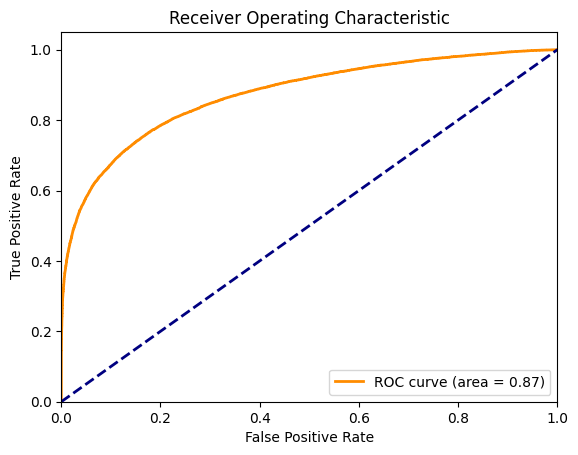

In [9]:
#first

import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


input_dim = X_train.shape[1]

model = Sequential([
    Dense(64, input_dim=input_dim, activation='relu'), 
    Dense(1, activation='sigmoid')                     
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

scores = model.evaluate(X_test, y_test)
print(f"Test Loss: {scores[0]}")
print(f"Test Accuracy: {scores[1]}")

y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


Epoch 1/10


C:\Users\max dore\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


50000/50000 ━━━━━━━━━━━━━━━━━━━━ 86s 2ms/step - accuracy: 0.7825 - loss: 0.4641 - val_accuracy: 0.7960 - val_loss: 0.4385
Epoch 2/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 146s 2ms/step - accuracy: 0.7978 - loss: 0.4358 - val_accuracy: 0.7975 - val_loss: 0.4360
Epoch 3/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 141s 2ms/step - accuracy: 0.8006 - loss: 0.4325 - val_accuracy: 0.7946 - val_loss: 0.4410
Epoch 4/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 142s 2ms/step - accuracy: 0.8014 - loss: 0.4307 - val_accuracy: 0.7970 - val_loss: 0.4372
Epoch 5/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 89s 2ms/step - accuracy: 0.8024 - loss: 0.4297 - val_accuracy: 0.7980 - val_loss: 0.4340
Epoch 6/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 95s 2ms/step - accuracy: 0.8019 - loss: 0.4295 - val_accuracy: 0.7978 - val_loss: 0.4335
Epoch 7/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 138s 2ms/step - accuracy: 0.8017 - loss: 0.4299 - val_accuracy: 0.7986 - val_loss: 0.4318
Epoch 8/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 145s 2ms/step - accuracy: 0.8028

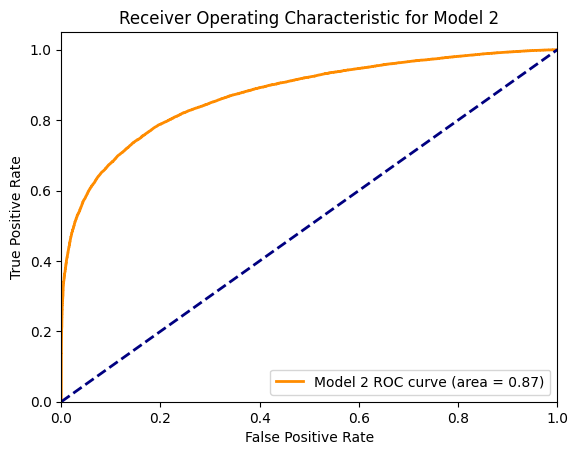

In [10]:
#second

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.metrics import roc_curve, auc

input_dim = X_train.shape[1]

model_2 = tf.keras.Sequential([
    tf.keras.layers.Dense(128, input_dim=input_dim, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model_2.compile(optimizer=tf.keras.optimizers.SGD(), loss='binary_crossentropy', metrics=['accuracy'])

history_2 = model_2.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

scores_2 = model_2.evaluate(X_test, y_test)
print(f"Test Loss for Model 2: {scores_2[0]}")
print(f"Test Accuracy for Model 2: {scores_2[1]}")

y_pred_proba_2 = model_2.predict(X_test).ravel()
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test, y_pred_proba_2)
roc_auc_2 = auc(fpr_2, tpr_2)

plt.figure()
plt.plot(fpr_2, tpr_2, color='darkorange', lw=2, label=f'Model 2 ROC curve (area = {roc_auc_2:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Model 2')
plt.legend(loc="lower right")
plt.show()



Epoch 1/10


C:\Users\max dore\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


50000/50000 ━━━━━━━━━━━━━━━━━━━━ 83s 2ms/step - accuracy: 0.7761 - loss: 0.4827 - val_accuracy: 0.7936 - val_loss: 0.4747
Epoch 2/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 147s 2ms/step - accuracy: 0.7880 - loss: 0.4907 - val_accuracy: 0.7931 - val_loss: 0.4813
Epoch 3/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 140s 2ms/step - accuracy: 0.7865 - loss: 0.5056 - val_accuracy: 0.7944 - val_loss: 0.4802
Epoch 4/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 143s 2ms/step - accuracy: 0.7834 - loss: 0.5162 - val_accuracy: 0.7938 - val_loss: 0.5028
Epoch 5/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 142s 2ms/step - accuracy: 0.7820 - loss: 0.5243 - val_accuracy: 0.7941 - val_loss: 0.4966
Epoch 6/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 139s 2ms/step - accuracy: 0.7826 - loss: 0.5255 - val_accuracy: 0.7904 - val_loss: 0.5038
Epoch 7/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 75s 1ms/step - accuracy: 0.7816 - loss: 0.5278 - val_accuracy: 0.7932 - val_loss: 0.4933
Epoch 8/10
50000/50000 ━━━━━━━━━━━━━━━━━━━━ 75s 2ms/step - accuracy: 0.7814

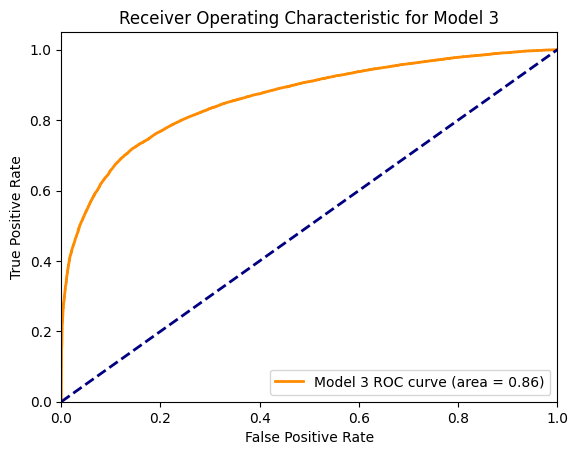

In [11]:
#third

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.metrics import roc_curve, auc

input_dim = X_train.shape[1]

model_3 = tf.keras.Sequential([
    tf.keras.layers.Dense(64, input_dim=input_dim, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model_3.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

history_3 = model_3.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

scores_3 = model_3.evaluate(X_test, y_test)
print(f"Test Loss for Model 3: {scores_3[0]}")
print(f"Test Accuracy for Model 3: {scores_3[1]}")

y_pred_proba_3 = model_3.predict(X_test).ravel()
fpr_3, tpr_3, thresholds_3 = roc_curve(y_test, y_pred_proba_3)
roc_auc_3 = auc(fpr_3, tpr_3)

plt.figure()
plt.plot(fpr_3, tpr_3, color='darkorange', lw=2, label=f'Model 3 ROC curve (area = {roc_auc_3:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Model 3')
plt.legend(loc="lower right")
plt.show()


## Exercise 4

Repeat exercise 4 from Lab 7, adding your best performing DNN as one of the models.  


## 4.1

### a

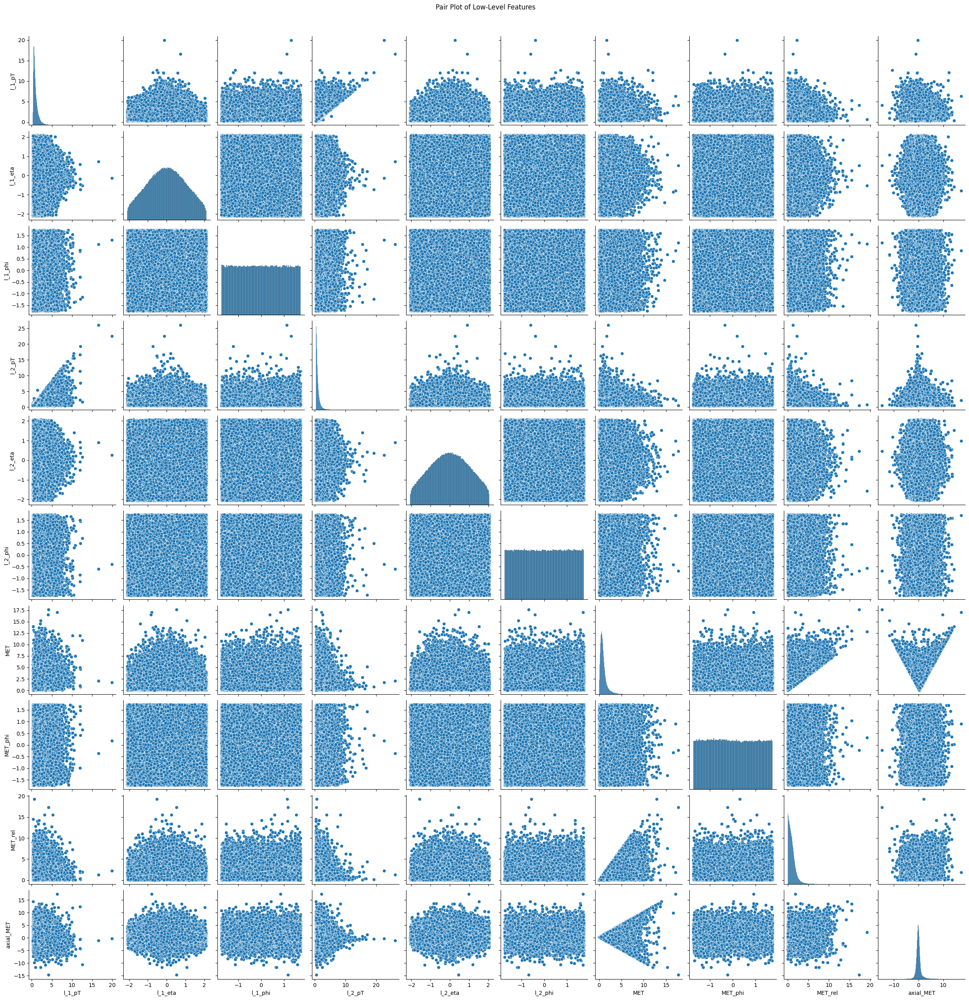

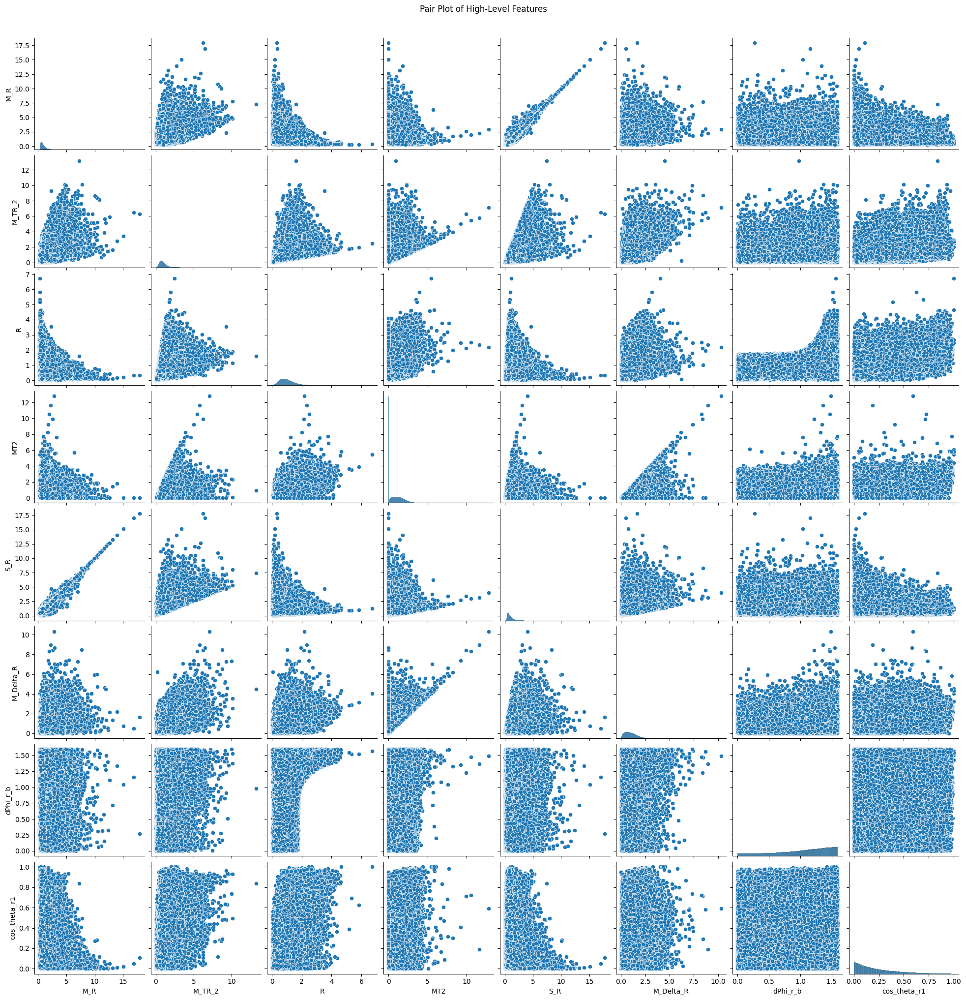

In [12]:
import seaborn as sns
import pandas as pd


def create_pair_plot(data, columns, title):
    sns.pairplot(data[columns])
    plt.suptitle(title, y=1.02)
    plt.show()

low_level_features = ["l_1_pT", "l_1_eta", "l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET"]
high_level_features = ["M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

create_pair_plot(df, low_level_features, title='Pair Plot of Low-Level Features')

create_pair_plot(df, high_level_features, title='Pair Plot of High-Level Features')


### b

Making these plots can be slow because creating each plot initiates a full loop over the data. Make at least one modification to your function in part a to speed it up. Can you propose a different method of creating histograms that would speed up making such pair plots?

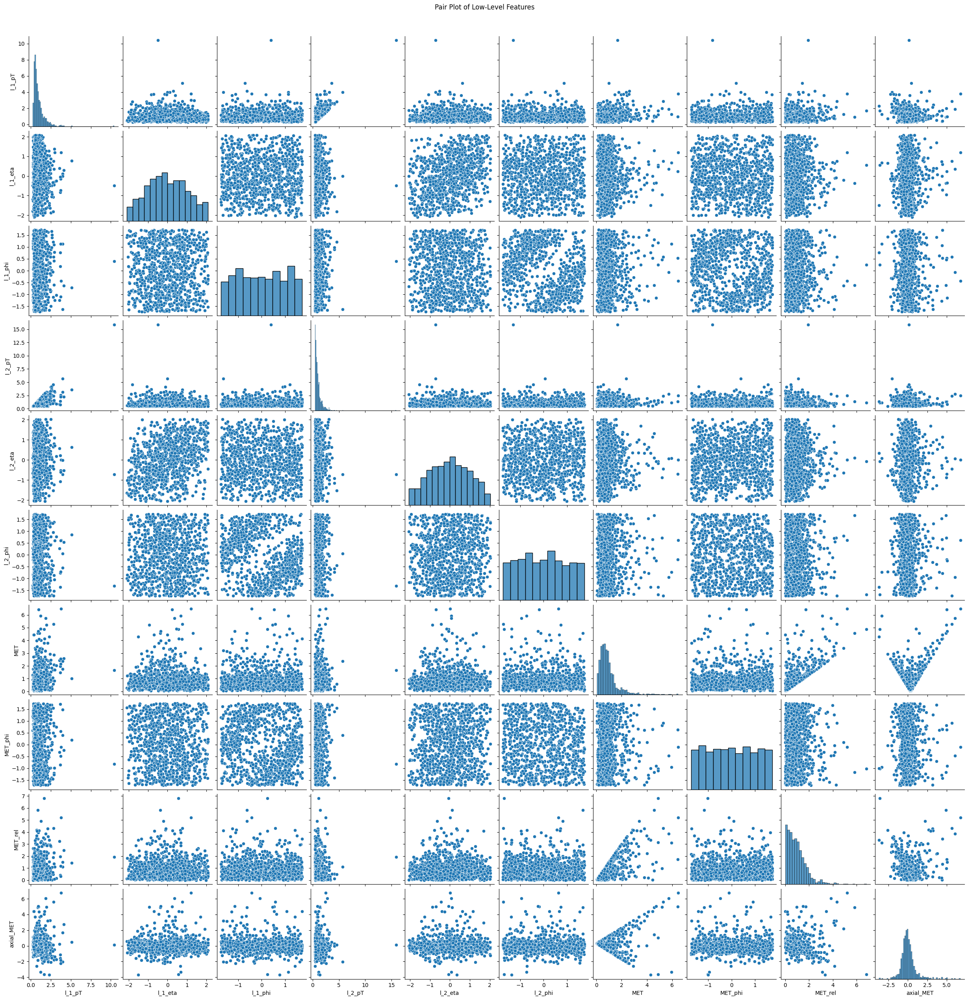

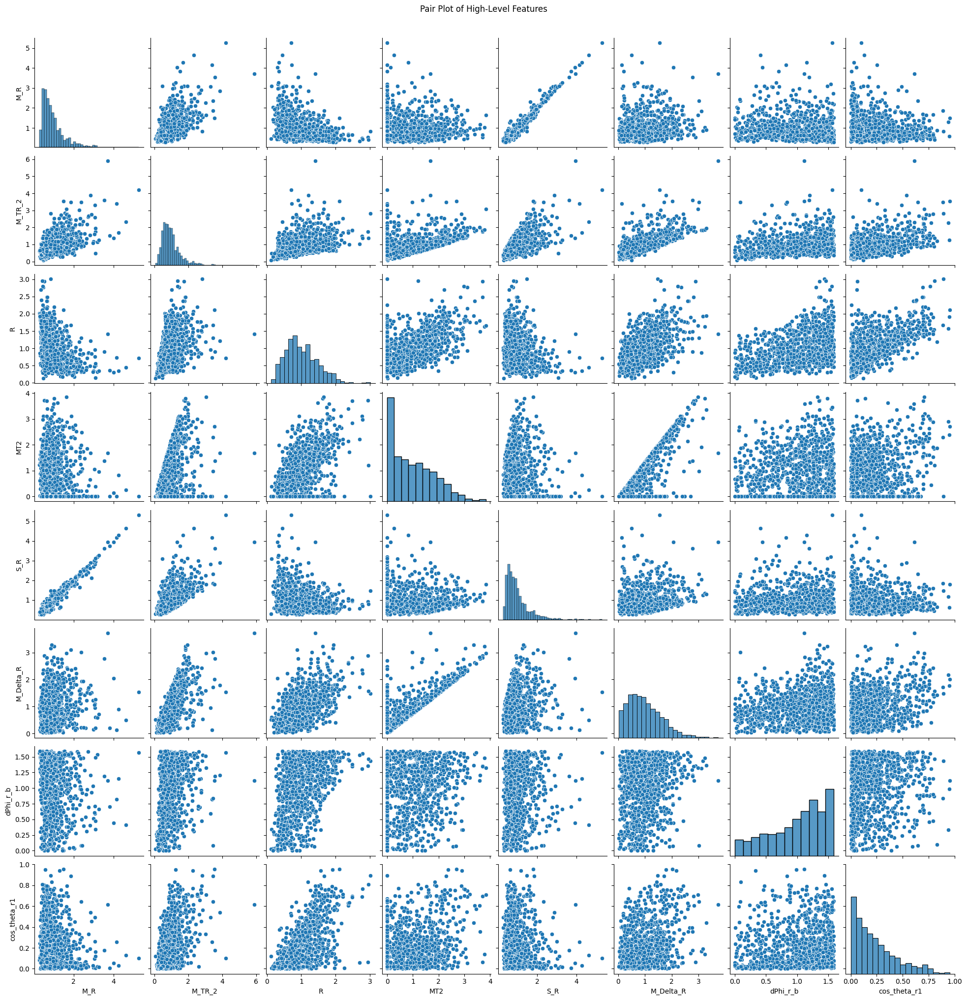

In [13]:
# sampling

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def create_pair_plot_sampled(data, columns, title, sample_size=1000):
    sampled_data = data[columns].sample(n=sample_size)
    sns.pairplot(sampled_data)
    plt.suptitle(title, y=1.02)
    plt.show()

create_pair_plot_sampled(df, low_level_features, title='Pair Plot of Low-Level Features')
create_pair_plot_sampled(df, high_level_features, title='Pair Plot of High-Level Features')


### c

#### Which observables appear to be best for separating signal from background?

**Answer:** "MT2" vs. "M_R" for high-level features and "l_2_pT" vs. "l_1_pT" for low-level features

## 4.2

### a

In [ ]:
#Tabulate installed

### b

Use numpy to compute the covariance matrix and correlation matrix between all observabes, and separately between low and high-level features.

In [15]:
import numpy as np

low_level_features = ["l_1_pT", "l_1_eta", "l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", 
                      "MET", "MET_phi", "MET_rel", "axial_MET"]
high_level_features = ["M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

all_features_array = df.to_numpy()
low_level_array = df[low_level_features].to_numpy()
high_level_array = df[high_level_features].to_numpy()

cov_all = np.cov(all_features_array, rowvar=False)
cor_all = np.corrcoef(all_features_array, rowvar=False)

cov_low = np.cov(low_level_array, rowvar=False)
cor_low = np.corrcoef(low_level_array, rowvar=False)

cov_high = np.cov(high_level_array, rowvar=False)
cor_high = np.corrcoef(high_level_array, rowvar=False)

print("Covariance Matrix for All Features:")
print(cov_all)

print("\nCorrelation Matrix for All Features:")
print(cor_all)

print("\nCovariance Matrix for Low-Level Features:")
print(cov_low)

print("\nCorrelation Matrix for Low-Level Features:")
print(cor_low)

print("\nCovariance Matrix for High-Level Features:")
print(cov_high)

print("\nCorrelation Matrix for High-Level Features:")
print(cor_high)


Covariance Matrix for All Features:
[[ 2.48288155e-01  1.33280819e-01 -3.54447484e-05 -7.88744129e-06
   6.37734185e-02  7.01516461e-05 -1.65538270e-05  1.91151596e-01
  -3.18861351e-04  1.25467988e-01  3.89197299e-02             nan
              nan             nan             nan             nan
              nan             nan             nan]
 [ 1.33280819e-01  4.70390273e-01 -9.68877496e-04  2.37190614e-04
   3.07405399e-01 -6.07456255e-04  6.93768785e-04  2.29558530e-01
  -1.37484201e-03  9.80984323e-02 -1.02152614e-02             nan
              nan             nan             nan             nan
              nan             nan             nan]
 [-3.54447484e-05 -9.68877496e-04  1.00519241e+00 -5.26616967e-05
  -5.50106159e-04  4.08614442e-01 -1.72424070e-04 -1.99830058e-03
  -1.25613879e-03 -7.04332925e-04 -1.89340301e-03             nan
              nan             nan             nan             nan
              nan             nan             nan]
 [-7.88744129e-06  

### c

Use tabulate to create a well formatted table of the covariance and correlation matrices, with nice headings and appropriate significant figures. Embed the table into this notebook.

In [16]:
import numpy as np
import pandas as pd
from tabulate import tabulate

# Assuming df is the DataFrame with the SUSY data
low_level_features = ["l_1_pT", "l_1_eta", "l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", 
                      "MET", "MET_phi", "MET_rel", "axial_MET"]
high_level_features = ["M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

low_level_array = df[low_level_features].to_numpy()
high_level_array = df[high_level_features].to_numpy()

# Compute covariance and correlation matrices
cov_low = np.cov(low_level_array, rowvar=False)
cor_low = np.corrcoef(low_level_array, rowvar=False)
cov_high = np.cov(high_level_array, rowvar=False)
cor_high = np.corrcoef(high_level_array, rowvar=False)

# Round matrices to 4 significant figures
cov_low = np.round(cov_low, 4)
cor_low = np.round(cor_low, 4)
cov_high = np.round(cov_high, 4)
cor_high = np.round(cor_high, 4)
#-------------------------------------------------------------

cov_low_df = pd.DataFrame(cov_low, columns=low_level_features, index=low_level_features)
cor_low_df = pd.DataFrame(cor_low, columns=low_level_features, index=low_level_features)

print("Covariance Matrix for Low-Level Features:")
print(tabulate(cov_low_df, headers="keys", tablefmt="github"))

print("\nCorrelation Matrix for Low-Level Features:")
print(tabulate(cor_low_df, headers="keys", tablefmt="github"))

cov_high_df = pd.DataFrame(cov_high, columns=high_level_features, index=high_level_features)
cor_high_df = pd.DataFrame(cor_high, columns=high_level_features, index=high_level_features)

print("\nCovariance Matrix for High-Level Features:")
print(tabulate(cov_high_df, headers="keys", tablefmt="github"))

print("\nCorrelation Matrix for High-Level Features:")
print(tabulate(cor_high_df, headers="keys", tablefmt="github"))


Covariance Matrix for Low-Level Features:
|           |   l_1_pT |   l_1_eta |   l_1_phi |   l_2_pT |   l_2_eta |   l_2_phi |     MET |   MET_phi |   MET_rel |   axial_MET |
|-----------|----------|-----------|-----------|----------|-----------|-----------|---------|-----------|-----------|-------------|
| l_1_pT    |   0.4704 |   -0.001  |    0.0002 |   0.3074 |   -0.0006 |    0.0007 |  0.2296 |   -0.0014 |    0.0981 |     -0.0102 |
| l_1_eta   |  -0.001  |    1.0052 |   -0.0001 |  -0.0006 |    0.4086 |   -0.0002 | -0.002  |   -0.0013 |   -0.0007 |     -0.0019 |
| l_1_phi   |   0.0002 |   -0.0001 |    1.0035 |   0.0012 |    0.0007 |   -0.2668 |  0.0007 |   -0.1849 |    0.0003 |     -0.0018 |
| l_2_pT    |   0.3074 |   -0.0006 |    0.0012 |   0.4285 |   -0.0008 |    0.0001 |  0.0801 |   -0.0022 |   -0.0008 |      0.0512 |
| l_2_eta   |  -0.0006 |    0.4086 |    0.0007 |  -0.0008 |    1.0058 |    0.0003 |  0.0002 |   -0.0016 |    0.0008 |     -0.0002 |
| l_2_phi   |   0.0007 |   -0.0002

### Part d

Write a function that takes a dataset and appropriate arguments and performs steps b and c.

In [17]:
import numpy as np
import pandas as pd
from tabulate import tabulate

def analyze_features(df, feature_groups, sig_figs=4):
    """
    Analyze features by computing covariance and correlation matrices, then
    outputting well-formatted tables for each group.

    Parameters:
    df (pd.DataFrame): The dataset.
    feature_groups (dict): A dictionary with group names as keys and lists of feature names as values.
    sig_figs (int): Number of significant figures for formatting. Default is 4.
    """
    for group_name, features in feature_groups.items():
        feature_array = df[features].to_numpy()

        covariance_matrix = np.cov(feature_array, rowvar=False)
        correlation_matrix = np.corrcoef(feature_array, rowvar=False)

        covariance_matrix = np.round(covariance_matrix, sig_figs)
        correlation_matrix = np.round(correlation_matrix, sig_figs)

        cov_df = pd.DataFrame(covariance_matrix, columns=features, index=features)
        cor_df = pd.DataFrame(correlation_matrix, columns=features, index=features)

        print(f"Covariance Matrix for {group_name}:")
        print(tabulate(cov_df, headers="keys", tablefmt="github"))
        print("\n")
        print(f"Correlation Matrix for {group_name}:")
        print(tabulate(cor_df, headers="keys", tablefmt="github"))
        print("\n")

low_level_features = ["l_1_pT", "l_1_eta", "l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", 
                      "MET", "MET_phi", "MET_rel", "axial_MET"]
high_level_features = ["M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

feature_groups = {
    "Low-Level Features": low_level_features,
    "High-Level Features": high_level_features
}

analyze_features(df, feature_groups, sig_figs=4)


Covariance Matrix for Low-Level Features:
|           |   l_1_pT |   l_1_eta |   l_1_phi |   l_2_pT |   l_2_eta |   l_2_phi |     MET |   MET_phi |   MET_rel |   axial_MET |
|-----------|----------|-----------|-----------|----------|-----------|-----------|---------|-----------|-----------|-------------|
| l_1_pT    |   0.4704 |   -0.001  |    0.0002 |   0.3074 |   -0.0006 |    0.0007 |  0.2296 |   -0.0014 |    0.0981 |     -0.0102 |
| l_1_eta   |  -0.001  |    1.0052 |   -0.0001 |  -0.0006 |    0.4086 |   -0.0002 | -0.002  |   -0.0013 |   -0.0007 |     -0.0019 |
| l_1_phi   |   0.0002 |   -0.0001 |    1.0035 |   0.0012 |    0.0007 |   -0.2668 |  0.0007 |   -0.1849 |    0.0003 |     -0.0018 |
| l_2_pT    |   0.3074 |   -0.0006 |    0.0012 |   0.4285 |   -0.0008 |    0.0001 |  0.0801 |   -0.0022 |   -0.0008 |      0.0512 |
| l_2_eta   |  -0.0006 |    0.4086 |    0.0007 |  -0.0008 |    1.0058 |    0.0003 |  0.0002 |   -0.0016 |    0.0008 |     -0.0002 |
| l_2_phi   |   0.0007 |   -0.0002